* This notebook was made to look at hourly salinity contours with weak/no wind condition, which could reflect how plume goes with only push by tides.

In [1]:
from __future__ import division, print_function
from salishsea_tools import (nc_tools,viz_tools,stormtools,tidetools)
from IPython.display import display, Math, Latex
from salishsea_tools.nowcast import figures
from datetime import datetime, timedelta
from pylab import *
import matplotlib.dates as mdates
import scipy.io as sio
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import math
import glob
import os
import datetime
%matplotlib inline

In [2]:
def results_dataset(period, grid, results_dir):
    """Return the results dataset for period (e.g. 1h or 1d)
    and grid (e.g. grid_T, grid_U) from results_dir.
    """
    filename_pattern = 'SalishSea_{period}_*_{grid}.nc'
    filepaths = glob(os.path.join(results_dir, filename_pattern.format(period=period, grid=grid)))
    return nc.Dataset(filepaths[0])

In [3]:
def date(year, month, day_start, day_end, period, grid):
    
    day_range = np.arange(day_start, day_end+1)
    day_len = len(day_range)
    files_all = [None] * day_len
    inds = np.arange(day_len)
    
    for i, day in zip(inds, day_range):
        run_date = datetime.datetime(year,month, day)
        results_home = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
        results_dir = os.path.join(results_home, run_date.strftime('%d%b%y').lower())
        filename = 'SalishSea_' + period + '_' + run_date.strftime('%Y%m%d').lower() + \
        '_' + run_date.strftime('%Y%m%d').lower() + '_' + grid + '.nc'
        file_single = os.path.join(results_dir, filename)
        files_all[i] = file_single

    return files_all

In [4]:
def plot_hrsalinity_contour( paths, run_date,):
    """This function was made to plot salinity contour in the specific
        region in the SoG"""
    fig, axs = plt.subplots(24, 1, figsize=(24, 160))
    z = 0 
    time_step = []
    for i in range(24):
        time_step.append(i)
    results_dir = os.path.join(paths, run_date.strftime('%d%b%y').lower())
    grid_T = results_dataset('1h','grid_T',results_dir)
    start_time = datetime.datetime(run_date.year, run_date.month, run_date.day, 0, 30)
    end_time = datetime.datetime(run_date.year, run_date.month,run_date.day, 23,30)
    numhours = (end_time - start_time).seconds //3600
    hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]
    
    for ax, tt, t in zip(axs, time_step, hours):
        #load variables
        latitude=grid_T.variables['nav_lat'] 
        longitude=grid_T.variables['nav_lon']
        S = grid_T.variables['vosaline']
        S =  np.ma.masked_values(S[tt, z], 0)
        #timesteps = grid_T.variables['time_counter']
        #zlevels = grid_T.variables['deptht']      
        viz_tools.set_aspect(ax, coords = 'map', lats=latitude)
        delta = 2
        cmap = plt.get_cmap('jet')
        cmap.set_bad('burlywood')
        mesh = ax.pcolormesh(longitude[:],latitude[:], S[:], cmap=cmap)
        clines = ax.contour(longitude[:], latitude[:], S[:], np.arange(0, 28, delta),
        colors='k')
        ax.clabel(clines,  inline = 1,fmt='%1.1f')
        #plt.clabel(CS, fontsize=9, inline=1)
        cbar = plt.colorbar(mesh, ax = ax)
        cbar.add_lines(clines)
        cbar.set_label('Pratical Salinity')
        ax.set_title(t.strftime('%d-%b-%Y %H:%M'))
        ax.set_xlim(-124., -122.5)
        ax.set_ylim(48.8, 49.4)
        ax.grid()
    return fig

* Days with weak wind by refering to the daily nowcast result webiste are June 17, 26 and 27 during my 14 days simulation from June 16-29.

In [5]:
print ("Date              (mmdd)       June 17     June 26    June 27 ")
print ('wind magnitude     (m/s)        1           0.9         0.4')
print ('wind direction     (NS/WE)      SW          NW          NW')
print ('Time               (mmss)      18:30       23:30       00:30')

Date              (mmdd)       June 17     June 26    June 27 
wind magnitude     (m/s)        1           0.9         0.4
wind direction     (NS/WE)      SW          NW          NW
Time               (mmss)      18:30       23:30       00:30


* June 17

In [5]:
from glob import glob
run_date = datetime.datetime(2015,6,17)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1057: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if aspect == 'normal':
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/axes/_base.py:1062: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif aspect in ('equal', 'auto'):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):
/home/jieliu/anaconda/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


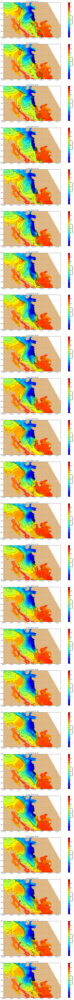

In [6]:
fig = plot_hrsalinity_contour(paths, run_date)

* June 26

In [7]:
run_date = datetime.datetime(2015,6,26)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

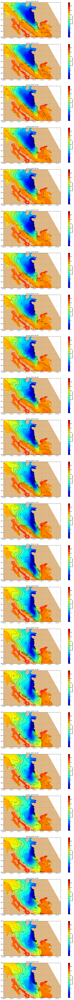

In [8]:
fig = plot_hrsalinity_contour(paths, run_date)

* June 27

In [9]:
run_date = datetime.datetime(2015,6,27)   
paths = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'

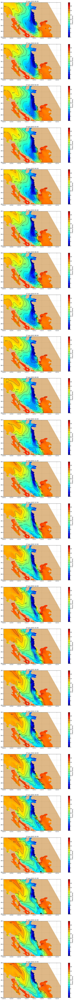

In [10]:
fig = plot_hrsalinity_contour(paths, run_date)